<a href="https://colab.research.google.com/github/youssefkamil/Arabic-Dialect-Identification/blob/main/Preprocessing_NLP_Arabic_Dialect_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install farasapy
!pip install pyarabic

     |████████████████████████████████| 126 kB 3.2 MB/s 


In [ ]:
!git clone https://github.com/aub-mind/arabert

Cloning into 'arabert'...
remote: Enumerating objects: 564, done.
remote: Counting objects: 100% (350/350), done.
remote: Compressing objects: 100% (252/252), done.
remote: Total 564 (delta 188), reused 247 (delta 92), pack-reused 214
Receiving objects: 100% (564/564), 9.16 MiB | 15.71 MiB/s, done.
Resolving deltas: 100% (311/311), done.


#Import Lib

In [ ]:
import pandas as pd
import re
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np
from arabert.preprocess import ArabertPreprocessor


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Arabic Dialect/tweetsWithLabels.csv',dtype='unicode')

In [ ]:
df=df.drop_duplicates(['id'])
df=df.drop([df.columns[0]],axis=1)
df=df.reset_index(drop=True)


In [ ]:
df

,id,dialect,tweet
0,1175358310087892992,IQ,@Nw8ieJUwaCAAreT لكن بالنهاية .. ينتفض .. يغير .
1,1175416117793349632,IQ,@7zNqXP0yrODdRjK يعني هذا محسوب على البشر .. ح...
2,1175450108898565888,IQ,@KanaanRema مبين من كلامه خليجي
3,1175471073770573824,IQ,@HAIDER76128900 يسلملي مرورك وروحك الحلوه💐
4,1175496913145217024,IQ,@hmo2406 وين هل الغيبه اخ محمد 🌸🌺
...,...,...,...
458193,1019484980282580992,BH,@Al_mhbaa_7 مبسوطين منك اللي باسطانا😅
458194,1021083283709407232,BH,@Zzainabali @P_ameerah والله ماينده ابش يختي
458195,1017477537889431552,BH,@Al_mhbaa_7 شو عملنا لك حنا تهربي مننا احنا مس...
458196,1022430374696239232,BH,@haneenalmwla الله يبارك فيها وبالعافيه 😋😋😋


In [ ]:
df=df.dropna()
df

,id,dialect,tweet
0,1175358310087892992,IQ,@Nw8ieJUwaCAAreT لكن بالنهاية .. ينتفض .. يغير .
1,1175416117793349632,IQ,@7zNqXP0yrODdRjK يعني هذا محسوب على البشر .. ح...
2,1175450108898565888,IQ,@KanaanRema مبين من كلامه خليجي
3,1175471073770573824,IQ,@HAIDER76128900 يسلملي مرورك وروحك الحلوه💐
4,1175496913145217024,IQ,@hmo2406 وين هل الغيبه اخ محمد 🌸🌺
...,...,...,...
458193,1019484980282580992,BH,@Al_mhbaa_7 مبسوطين منك اللي باسطانا😅
458194,1021083283709407232,BH,@Zzainabali @P_ameerah والله ماينده ابش يختي
458195,1017477537889431552,BH,@Al_mhbaa_7 شو عملنا لك حنا تهربي مننا احنا مس...
458196,1022430374696239232,BH,@haneenalmwla الله يبارك فيها وبالعافيه 😋😋😋


In [ ]:
df['dialect'].describe()

count     458197
unique        18
top           EG
freq       57636
Name: dialect, dtype: object

In [ ]:
df['tweet'][0]

'@Nw8ieJUwaCAAreT لكن بالنهاية .. ينتفض .. يغير .'

In [ ]:
df['dialect'].unique()

array(['IQ', 'LY', 'QA', 'PL', 'SY', 'TN', 'JO', 'MA', 'SA', 'YE', 'DZ',
       'EG', 'LB', 'KW', 'OM', 'SD', 'AE', 'BH'], dtype=object)

#Test AraBERT Pre-Proccessing

In [ ]:
  model_name = "aubmindlab/bert-base-arabertv2"
  arabert_prep = ArabertPreprocessor( model_name=model_name,
                                    remove_html_markup = False,
                                    replace_urls_emails_mentions = False,
                                    strip_tashkeel = True,
                                    strip_tatweel = True,
                                    insert_white_spaces = False,
                                    remove_non_digit_repetition = True,
                                    replace_slash_with_dash = None,
                                    map_hindi_numbers_to_arabic = True,
                                    apply_farasa_segmentation = True)


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


100%|██████████| 241M/241M [00:20<00:00, 12.0MiB/s]


[2022-03-14 00:55:10,403 - farasapy_logger - WARNING]: Be careful with large lines as they may break on interactive mode. You may switch to Standalone mode for such cases.


In [ ]:
text = "ولن نبالغ إذا قلنا: إن 'هاتف' أو@يبيب @asdda 'كمبيوتر اههههههههه لمكتبَ 213  1213 ' فـــــي زمننا هذا ضروري"
text=arabert_prep.preprocess(text)
text

"و+ لن نبالغ إذا قل +نا : إن ' هاتف ' أو @ يبيب @asdda ' كمبيوتر اه +ه ل+ مكتب 213 1213 ' في زمن +نا هذا ضروري"

#Remove Emoji function

In [ ]:
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0010FFFF"  # wider range
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

#Preproccessing Approches

##First approach

In [ ]:
def clean_tweet_ap_1(tweet):
  pat1 = '@[^ ]+' # Remove mentions
  pat2 = '#'      #
  pat3 = '[0-9]'  #remove Number
  pat4 = '[A-Za-z]' #remove english charctares
  combined_pat = '|'.join((pat1, pat2, pat3, pat4))
  tweet = re.sub(combined_pat, '', tweet)
  tweet = re.sub('[ى]', 'ي', tweet)
  tweet = re.sub('[إأٱآا]', 'ا', tweet)
  tweet = re.sub('[ؤئ]', 'ء', tweet)
  tweet = re.sub('[ة]', 'ه', tweet)
  tweet = re.sub('[\n]', ' ', tweet)
  tweet = re.sub('[%s]' % re.escape("""!"#$%&'()*+,،-./:;<=>؟?@[\]^_`{|}~"""), '', tweet)  # remove punctuation
  tweet=re.sub(r'(.)\1+', r'\1', tweet) # remove repeated char like هههه  
  tweet=re.sub('١|٠|٢|٣|٤|٥|٦|٧|٨|٩', '', tweet)  # remove hindi numbers

  tweet=remove_emoji(tweet)
  
  return tweet

##Second Approach

In [ ]:
model_name = "aubmindlab/bert-base-arabertv2"
arabert_prep = ArabertPreprocessor( model_name=model_name,
                                    remove_html_markup = False,
                                    replace_urls_emails_mentions = False,
                                    strip_tashkeel = True,
                                    strip_tatweel = True,
                                    insert_white_spaces = False,
                                    remove_non_digit_repetition = False,
                                    replace_slash_with_dash = None,
                                    map_hindi_numbers_to_arabic = True,
                                    apply_farasa_segmentation = None)

def clean_tweet_ap_2(tweet):

  pat1 = '@[^ ]+' # Remove mentions
  pat2 = '#'      #
  pat3 = '[0-9]'  #remove Number
  pat4 = '[A-Za-z]' #remove english charctares
  combined_pat = '|'.join((pat1, pat2, pat3, pat4))
  tweet = re.sub(combined_pat, '', tweet)
  tweet = re.sub('[ى]', 'ي', tweet)
  tweet = re.sub('[إأٱآا]', 'ا', tweet)
  tweet = re.sub('[ؤئ]', 'ء', tweet)
  tweet = re.sub('[ة]', 'ه', tweet)
  tweet = re.sub('[\n]', ' ', tweet)
  tweet = re.sub('[%s]' % re.escape("""!"#$%&'()*+,،-./:;<=>؟?@[\]^_`{|}~"""), '', tweet)  # remove punctuation
  tweet=re.sub(r'(.)\1+', r'\1', tweet) # remove repeated char like هههه  

  tweet=remove_emoji(tweet)

  tweet=arabert_prep.preprocess(tweet)

  return tweet

[2022-03-10 06:25:15,591 - farasapy_logger - WARNING]: Be careful with large lines as they may break on interactive mode. You may switch to Standalone mode for such cases.


#Apply cleaning

##First approach

In [ ]:
clean_df=df.copy()
for i in range(len(clean_df)):
  try:
    tweet=df['tweet'][i]
    tweet=clean_tweet_ap_1(tweet)
    clean_df['tweet'][i]=tweet
    if i%1000==0:
      print(i)
  except:
    print(tweet)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000

87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000

In [ ]:
clean_df.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets2.csv')

##Second approach

In [ ]:
clean_df=df.copy()
for i in range(len(clean_df)):
  try:
    tweet=df['tweet'][i]
    tweet=clean_tweet_ap_2(tweet)
    clean_df['tweet'][i]=tweet
    if i%1000==0:
      print(i)
  except:
    print(tweet)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000

87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000

In [ ]:
clean_df.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets2.csv')

# AR_wordcloid

In [ ]:
tweets=clean_df.loc[df['dialect']=='EG']
tweets=tweets['tweet'].str.cat(sep=' ')
tweets

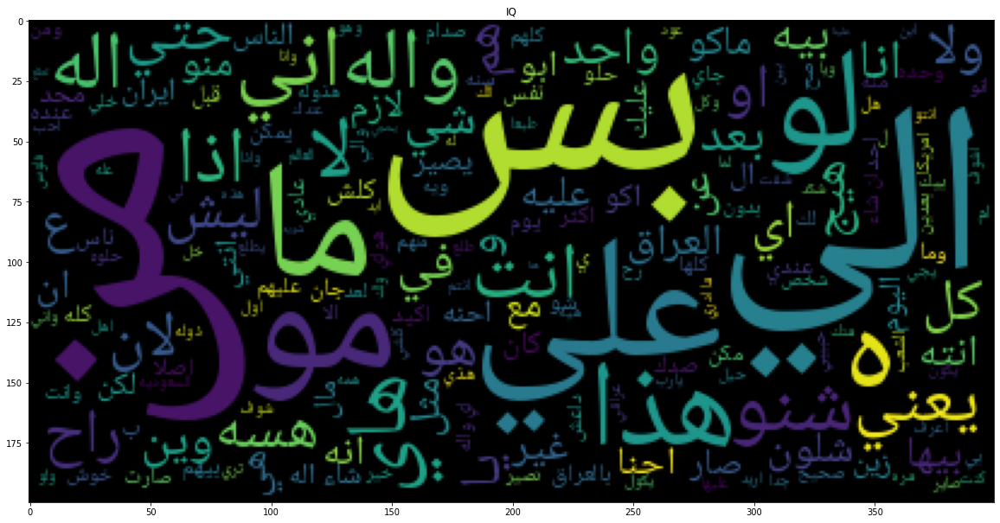

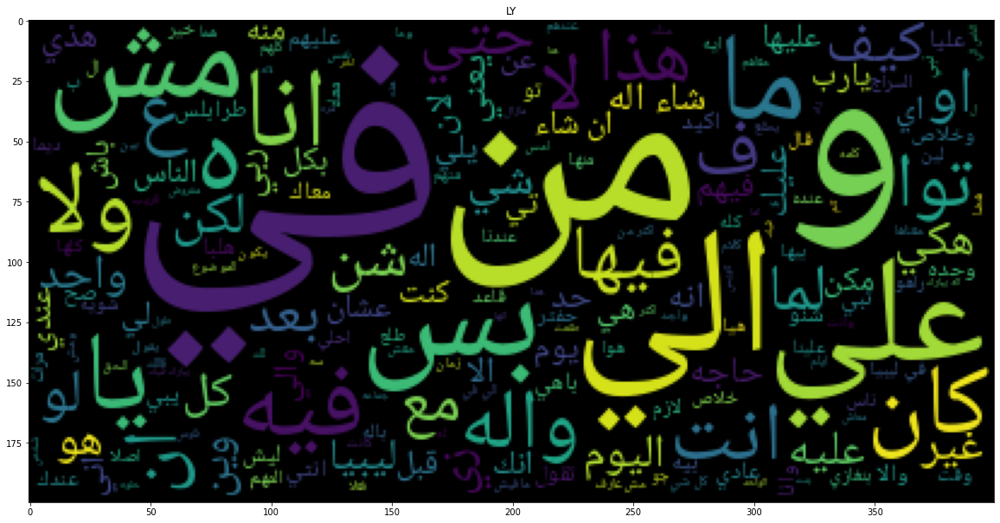

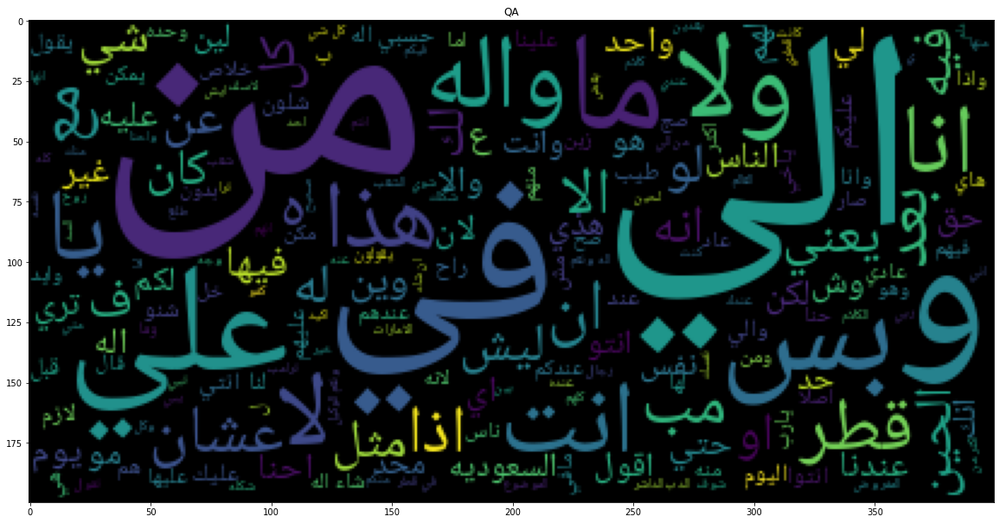

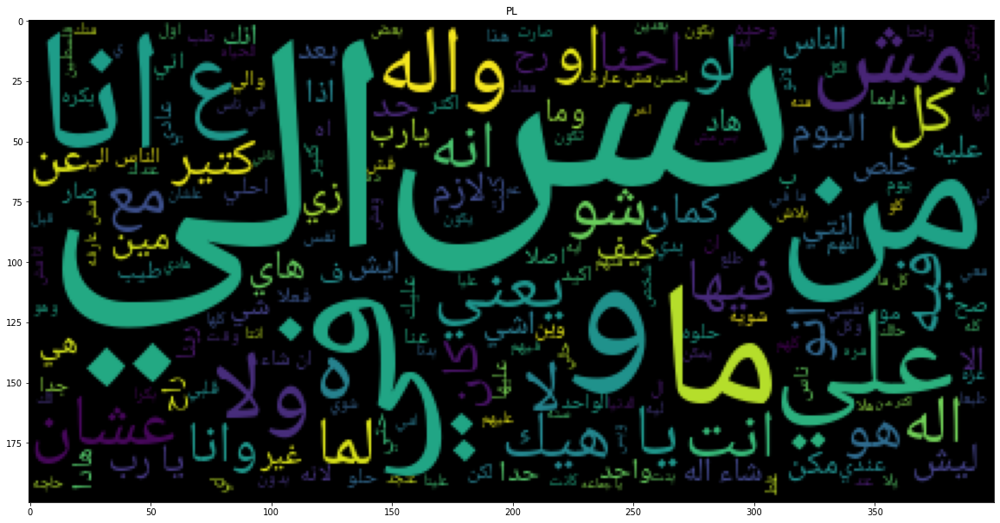

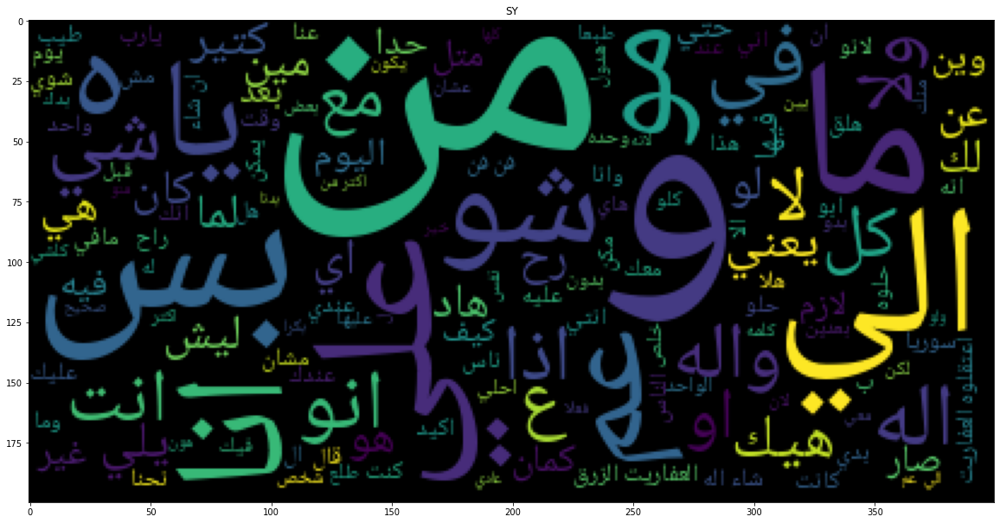

...

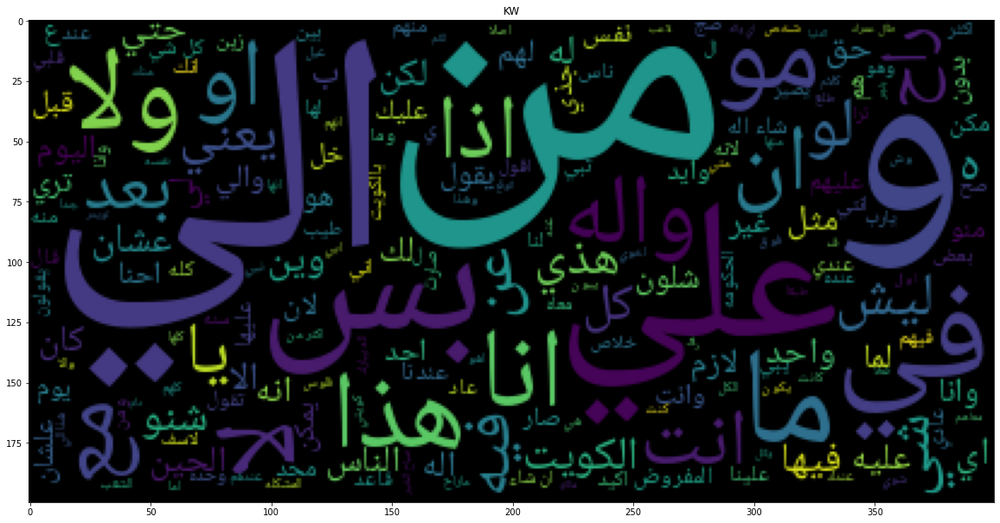

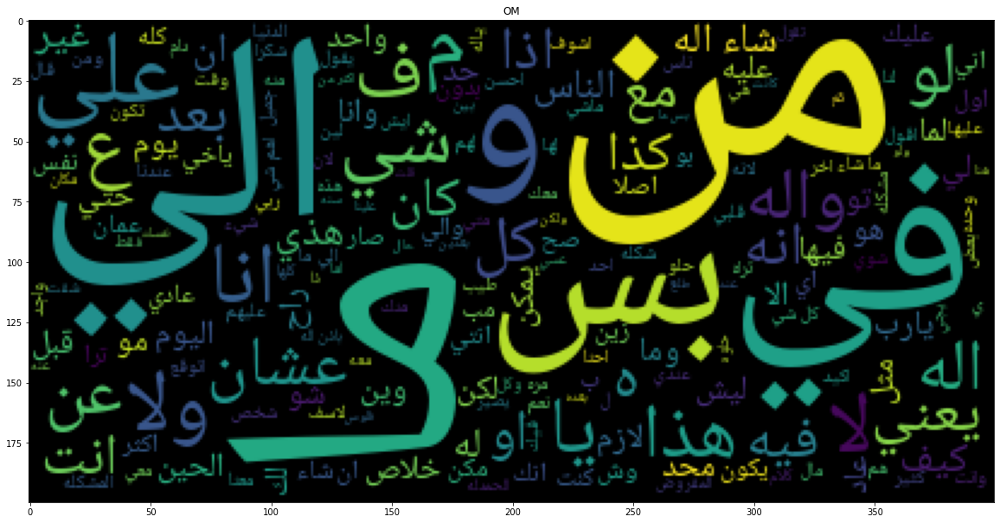

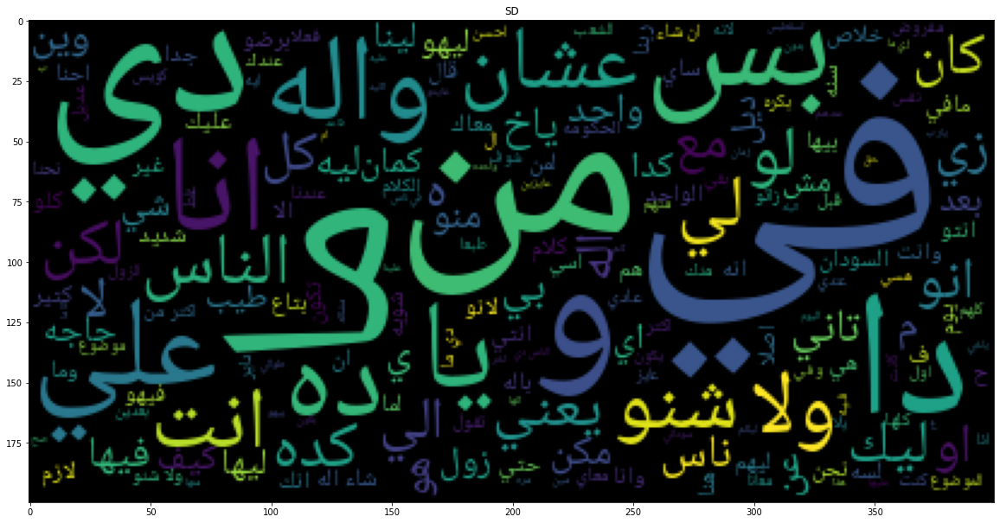

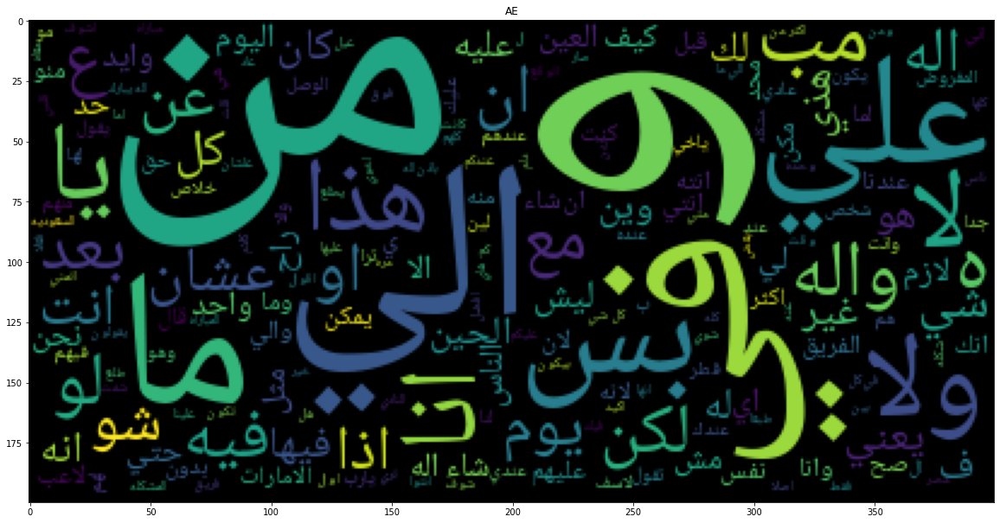

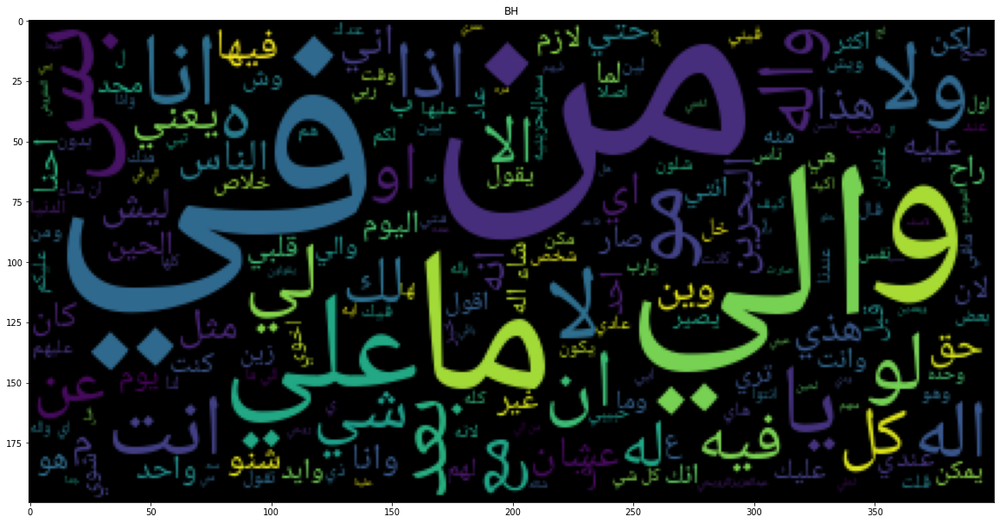

In [ ]:
from ar_wordcloud import ArabicWordCloud
for dialect in (clean_df['dialect'].unique()):
  tweets=clean_df.loc[df['dialect']==dialect]
  tweets=tweets['tweet'].str.cat(sep=' ')
  
  awc = ArabicWordCloud()
  wc = awc.from_text(tweets)

  plt.figure(figsize = (20,20))
  plt.imshow(wc)
  plt.title(dialect)
  plt.show()


#Most Common

In [ ]:
corpus=''
for text in clean_df['tweet']:
    try:
      corpus+=text
    except:
      print(text)
# corpus

In [ ]:
len(corpus)

31068667

In [ ]:
wordlist = corpus.split()

In [ ]:
wordlist

In [ ]:
import collections
wordlist=collections.Counter(wordlist)
wordlist

Counter({'لكن': 8124,
         'بالنهايه': 170,
         'ينتفض': 9,
         'يغيريعني': 1,
         'هذا': 10899,
         'محسوب': 62,
         'علي': 54582,
         'البشر': 607,
         'حيونه': 7,
         'وحشيه': 8,
         'وتطلبون': 5,
         'من': 94141,
         'الغرب': 172,
         'يحترمكم': 2,
         'ويءمن': 2,
         'بدينكم': 2,
         'ولاينعتكم': 1,
         'بالارهابمبين': 1,
         'كلامه': 547,
         'خليجييسلملي': 1,
         'مرورك': 17,
         'وروحك': 36,
         'الحلوهوين': 1,
         'هل': 1928,
         'الغيبه': 85,
         'اخ': 447,
         'محمدياخي': 1,
         'الارهابي': 78,
         'اذا': 10869,
         'كان': 14384,
         'عراقي': 159,
         'سعودي': 474,
         'فلسطيني': 138,
         'وين': 7030,
         'المشكله': 1735,
         'باب': 959,
         'الفرضخليجي': 1,
         'وماعنده': 48,
         'رحمه': 368,
         'المساس': 9,
         'بقدسيتك': 1,
         'اله': 36377,
         'يرضي': 313,
       

In [ ]:
wordlist.most_common(100)

[('من', 94141),
 ('الي', 75513),
 ('في', 73626),
 ('ما', 67539),
 ('و', 61122),
 ('علي', 54582),
 ('بس', 40445),
 ('يا', 37042),
 ('اله', 36377),
 ('كل', 27428),
 ('مش', 27232),
 ('انا', 26180),
 ('ولا', 26076),
 ('ان', 18812),
 ('لا', 18174),
 ('مع', 17775),
 ('شي', 17509),
 ('لو', 16653),
 ('واله', 15697),
 ('انت', 15236),
 ('عن', 15074),
 ('ع', 14418),
 ('كان', 14384),
 ('او', 14157),
 ('عشان', 12569),
 ('الناس', 11792),
 ('هو', 11422),
 ('فيه', 11347),
 ('واحد', 11206),
 ('انه', 11039),
 ('هذا', 10899),
 ('اذا', 10869),
 ('غير', 10734),
 ('مو', 10697),
 ('بعد', 10518),
 ('حتي', 10405),
 ('اي', 9983),
 ('الا', 9845),
 ('يعني', 9831),
 ('لي', 9675),
 ('ف', 9160),
 ('يوم', 9069),
 ('لما', 8971),
 ('ده', 8876),
 ('فيها', 8483),
 ('لكن', 8124),
 ('شو', 7846),
 ('له', 7842),
 ('دي', 7491),
 ('راح', 7433),
 ('حد', 7210),
 ('عليه', 7074),
 ('لازم', 7051),
 ('وين', 7030),
 ('ناس', 6938),
 ('احنا', 6923),
 ('قبل', 6851),
 ('اني', 6514),
 ('زي', 6474),
 ('ليش', 6305),
 ('عليك', 6285),
 ('مره'

#Test Data

##First approach

In [ ]:
with open ("/content/QADI_Test.txt", encoding='utf-8') as f:
  lines = f.readlines()

In [ ]:
lines

['@USER امممم لا لا EMOJI ماشي حالو EMOJI\tPL\n',
 'يا عم لو يحكولي سافر شالح حوافق بس سفروني URL\tPL\n',
 '@USER ههههههههه قرار أقفال المحلات الساعة NUM كان فيه فوائد اكثر من ذي\tSA\n',
 'عندنا بيسجلو مواد انساني عشان ترفعلهم ال jpa ردت في صدرهم و اجلو امتحانات الانساني و هيخلصو اخر ناس\tEG\n',
 '@USER يا فديت بنت اليمن وصوتها والله يجنن ربي يحفظ هالصوت ويحفظ وطنا اليمن الغالي\tYE\n',
 '@USER عن نفسي ماشفت شي\tYE\n',
 'زين شنو الفائدة EMOJI ؟ شنو هالغباء الي صاير بعقل البنات ! ! URL\tIQ\n',
 '@USER هذا اللي يقول لك يموت ولا ينسى EMOJI\tBH\n',
 '@USER بتحب فرجيك قديش اشقر انت EMOJI ( لو بتموت ما رح محي الصور )\tSY\n',
 'الناس اللي تلوم نفسها ، اللي تسامح بسهولة ، اللي ماتغلط على احد ، اللي تصبر كثير ، اللي يحبون من قلب ، اقولكم شي , محد يستاهلكم .\tYE\n',
 'بشرى طيبة في هذه الساعات . . NEWLINE بعد مفاوضات حثيثة الان تم السماح لبقاء الباخرة الصينية ونزول الحاويات اللي قلتوا . .. URL\tYE\n',
 '@USER اطلعو تيجالي وما بدنا حد بداله المهم اطلعووه EMOJI\tPL\n',
 '@USER اي والله شي بفرفح EMOJ

In [ ]:
test_set=[]
for line in lines:
  line=line.rstrip("\n")
  test_set.append(line.split('\t'))

In [ ]:
test_set=pd.DataFrame(test_set,columns=['tweet','dialect'])

In [ ]:
test_set

,tweet,dialect
0,@USER امممم لا لا EMOJI ماشي حالو EMOJI,PL
1,يا عم لو يحكولي سافر شالح حوافق بس سفروني URL,PL
2,@USER ههههههههه قرار أقفال المحلات الساعة NUM ...,SA
3,عندنا بيسجلو مواد انساني عشان ترفعلهم ال jpa ر...,EG
4,@USER يا فديت بنت اليمن وصوتها والله يجنن ربي ...,YE
...,...,...
3498,@USER ياستي ابوس ايدك ماتسوقيش صورتنا اكتر ماه...,EG
3499,@USER ونعم فيكم يابو فيحان,SA
3500,@USER مش عارف بس العيل لعيب بكل,LY
3501,@USER بالضبط كدا الناس لازم تضغط اكتر علي المج...,SD


In [ ]:
clean_df=test_set.copy()
for i in range(len(clean_df)):
    tweet=clean_df['tweet'][i]
    tweet=clean_tweet_ap_1(tweet)
    clean_df['tweet'][i]=tweet
    if i%1000==0:
      print(i)


0
1000
2000
3000


In [ ]:
clean_df.drop(clean_df[clean_df['dialect']=='MSA'].index ,inplace=True)

In [ ]:
clean_df['dialect'].unique()

array(['PL', 'SA', 'EG', 'YE', 'IQ', 'BH', 'SY', 'LB', 'AE', 'OM', 'TN',
       'JO', 'KW', 'SD', 'QA', 'MA', 'DZ', 'LY'], dtype=object)

In [ ]:
clean_df.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets Test set 1.csv')

In [ ]:
testdata=pd.read_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets Test set 1.csv')
traindata=pd.read_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets.csv',lineterminator='\n')

In [ ]:
traindata

,Unnamed: 0,id,dialect,tweet
0,0,1.175358e+18,IQ,لكن بالنهايه ينتفض يغير
1,1,1.175416e+18,IQ,يعني هذا محسوب علي البشر حيونه ووحشيه وتطلب...
2,2,1.175450e+18,IQ,مبين من كلامه خليجي
3,3,1.175471e+18,IQ,يسلملي مرورك وروحك الحلوه
4,4,1.175497e+18,IQ,وين هل الغيبه اخ محمد
...,...,...,...,...
458193,458193,1.019485e+18,BH,مبسوطين منك اللي باسطانا
458194,458194,1.021083e+18,BH,والله ماينده ابش يختي
458195,458195,1.017478e+18,BH,شو عملنا لك حنا تهربي مننا احنا مساكين ليش بت...
458196,458196,1.022430e+18,BH,الله يبارك فيها وبالعافيه


In [ ]:
testdata

,Unnamed: 0,tweet,dialect
0,0,ام لا لا ماشي حالو,PL
1,1,يا عم لو يحكولي سافر شالح حوافق بس سفروني,PL
2,2,ه قرار اقفال المحلات الساعه كان فيه فواءد اكث...,SA
3,3,عندنا بيسجلو مواد انساني عشان ترفعلهم ال ردت ف...,EG
4,4,يا فديت بنت اليمن وصوتها واله يجن ربي يحفظ ها...,YE
...,...,...,...
3298,3498,ياستي ابوس ايدك ماتسوقيش صورتنا اكتر ماهي سيءه,EG
3299,3499,ونعم فيكم يابو فيحان,SA
3300,3500,مش عارف بس العيل لعيب بكل,LY
3301,3501,بالضبط كدا الناس لازم تضغط اكتر علي المجلس ال...,SD


In [ ]:
for train_tweet in traindata['tweet']:
  for test_tweet in testdata['tweet']:
    if train_tweet==test_tweet:
      traindata=traindata.drop(traindata[traindata['tweet']==train_tweet].index)
      print("Removed from train set : ", train_tweet)

Removed from train set :   علي اساس انت متاكل دولمه 
Removed from train set :   جهله جهله جهله زين
Removed from train set :  منتشره سالفه انتقاد الجمعه ويقولون الناس تصير مسلمه يوم الجمعه ويستخدمون مقولات ما اعرف شنو يستفادون
Removed from train set :   رح اخذ سكرين شوت واشوفهم التويت بالمطار 
Removed from train set :   وهاي يجي وياها بروشور لو علي البركه 
Removed from train set :   اليوم الثلاثاء مو الجمعه 
Removed from train set :   واذا عصب عليج شلون 
Removed from train set :   شعندك سوبر ماركت كاعد وساكت والسبلت يكفخ بيك
Removed from train set :   بس كون انت بخير اني بخير
Removed from train set :   اتفق بس كان زمان هسه لا
Removed from train set :   من ناحيه الفخامه اتفق بس مستحيل اخلي افتار
Removed from train set :   لازم مدرب طرطور مايتعارض مع بيريز
Removed from train set :  لنلطم بالشور والبندريه علي كاظم الغيظ بقلم احمد الرماحي 
Removed from train set :  اكو من جاي يغذي ويكبره البسوا ولحد يجيبه بالطاري ينتهي 
Removed from train set :   عبالي بس اني عندي هاي المشكله 
Removed from 

In [ ]:
traindata

,Unnamed: 0,id,dialect,tweet
0,0,1.175358e+18,IQ,لكن بالنهايه ينتفض يغير
1,1,1.175416e+18,IQ,يعني هذا محسوب علي البشر حيونه ووحشيه وتطلب...
2,2,1.175450e+18,IQ,مبين من كلامه خليجي
3,3,1.175471e+18,IQ,يسلملي مرورك وروحك الحلوه
4,4,1.175497e+18,IQ,وين هل الغيبه اخ محمد
...,...,...,...,...
458193,458193,1.019485e+18,BH,مبسوطين منك اللي باسطانا
458194,458194,1.021083e+18,BH,والله ماينده ابش يختي
458195,458195,1.017478e+18,BH,شو عملنا لك حنا تهربي مننا احنا مساكين ليش بت...
458196,458196,1.022430e+18,BH,الله يبارك فيها وبالعافيه


In [ ]:
traindata.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets train set 2.csv')

##Second approach

In [ ]:
!wget  https://github.com/qcri/QADI/blob/4e450108bfd7b58d16a6d58bdf6e0bcbef1bbc87/testset/QADI_test.txt

--2022-03-10 05:09:01--  https://github.com/qcri/QADI/blob/4e450108bfd7b58d16a6d58bdf6e0bcbef1bbc87/testset/QADI_test.txt
Resolving github.com (github.com)... 13.114.40.48
Connecting to github.com (github.com)|13.114.40.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘QADI_test.txt.1’

QADI_test.txt.1         [  <=>               ]   1.40M  6.06MB/s    in 0.2s    

2022-03-10 05:09:02 (6.06 MB/s) - ‘QADI_test.txt.1’ saved [1473435]



In [ ]:
with open ("/content/QADI_Test.txt", encoding='utf-8') as f:
  lines = f.readlines()

In [ ]:
lines

['@USER امممم لا لا EMOJI ماشي حالو EMOJI\tPL\n',
 'يا عم لو يحكولي سافر شالح حوافق بس سفروني URL\tPL\n',
 '@USER ههههههههه قرار أقفال المحلات الساعة NUM كان فيه فوائد اكثر من ذي\tSA\n',
 'عندنا بيسجلو مواد انساني عشان ترفعلهم ال jpa ردت في صدرهم و اجلو امتحانات الانساني و هيخلصو اخر ناس\tEG\n',
 '@USER يا فديت بنت اليمن وصوتها والله يجنن ربي يحفظ هالصوت ويحفظ وطنا اليمن الغالي\tYE\n',
 '@USER عن نفسي ماشفت شي\tYE\n',
 'زين شنو الفائدة EMOJI ؟ شنو هالغباء الي صاير بعقل البنات ! ! URL\tIQ\n',
 '@USER هذا اللي يقول لك يموت ولا ينسى EMOJI\tBH\n',
 '@USER بتحب فرجيك قديش اشقر انت EMOJI ( لو بتموت ما رح محي الصور )\tSY\n',
 'الناس اللي تلوم نفسها ، اللي تسامح بسهولة ، اللي ماتغلط على احد ، اللي تصبر كثير ، اللي يحبون من قلب ، اقولكم شي , محد يستاهلكم .\tYE\n',
 'بشرى طيبة في هذه الساعات . . NEWLINE بعد مفاوضات حثيثة الان تم السماح لبقاء الباخرة الصينية ونزول الحاويات اللي قلتوا . .. URL\tYE\n',
 '@USER اطلعو تيجالي وما بدنا حد بداله المهم اطلعووه EMOJI\tPL\n',
 '@USER اي والله شي بفرفح EMOJ

In [ ]:
test_set=[]
for line in lines:
  line=line.rstrip("\n")
  test_set.append(line.split('\t'))

In [ ]:
test_set=pd.DataFrame(test_set,columns=['tweet','dialect'])

In [ ]:
test_set

,tweet,dialect
0,@USER امممم لا لا EMOJI ماشي حالو EMOJI,PL
1,يا عم لو يحكولي سافر شالح حوافق بس سفروني URL,PL
2,@USER ههههههههه قرار أقفال المحلات الساعة NUM ...,SA
3,عندنا بيسجلو مواد انساني عشان ترفعلهم ال jpa ر...,EG
4,@USER يا فديت بنت اليمن وصوتها والله يجنن ربي ...,YE
...,...,...
3498,@USER ياستي ابوس ايدك ماتسوقيش صورتنا اكتر ماه...,EG
3499,@USER ونعم فيكم يابو فيحان,SA
3500,@USER مش عارف بس العيل لعيب بكل,LY
3501,@USER بالضبط كدا الناس لازم تضغط اكتر علي المج...,SD


In [ ]:
clean_df=test_set.copy()
for i in range(len(clean_df)):
    tweet=clean_df['tweet'][i]
    tweet=clean_tweet_ap_2(tweet)
    clean_df['tweet'][i]=tweet
    if i%1000==0:
      print(i)


0
1000
2000
3000


In [ ]:
clean_df.drop(clean_df[clean_df['dialect']=='MSA'].index ,inplace=True)

In [ ]:
clean_df['dialect'].unique()

array(['PL', 'SA', 'EG', 'YE', 'IQ', 'BH', 'SY', 'LB', 'AE', 'OM', 'TN',
       'JO', 'KW', 'SD', 'QA', 'MA', 'DZ', 'LY'], dtype=object)

In [ ]:
clean_df.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets Test set 2.csv')

In [ ]:
testdata=pd.read_csv('/content/drive/MyDrive/Arabic Dialect/Test_data.csv')
traindata=pd.read_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets2.csv')

In [ ]:
traindata

,Unnamed: 0,id,dialect,tweet
0,0,1175358310087892992,IQ,لكن ب ال نهاي ه ينتفض يغير
1,1,1175416117793349632,IQ,يعني هذا محسوب علي ال بشر حي ون ه وحشي ه و تطل...
2,2,1175450108898565888,IQ,مبين من كلام ه خليجي
3,3,1175471073770573824,IQ,يسلملي مرور ك و روح ك ال حلو ه
4,4,1175496913145217024,IQ,وين هل ال غيب ه أخ محمد
...,...,...,...,...
458192,458193,1019484980282580992,BH,مبسوط +ين من +ك الي باسط +ا +نا
458193,458194,1021083283709407232,BH,و+ اله ماينده ابش يخت +ي
458194,458195,1017477537889431552,BH,شو عمل +نا ل+ +ك حنا تهرب +ي من +ا اح +نا مساك...
458195,458196,1022430374696239232,BH,اله يبارك في +ها و+ ب+ ال+ عافيه


In [ ]:
testdata

,Unnamed: 0,tweet,dialect
0,0,ام لا لا ماشي حالو,PL
1,1,يا عم لو يحكولي سافر شالح حوافق بس سفروني,PL
2,2,ه قرار اقفال ال+ محل +ات ال+ ساعه كان في +ه فو...,SA
3,3,عند +نا بيسجلو مواد إنساني عشان ترفعلهم ال رد ...,EG
4,4,يا فدي +ت بنت ال+ يمن و+ صوت +ها و+ اله يجن رب...,YE
...,...,...,...
3298,3498,ياستي ابوس ايدك ماتسوقيش صور +ت +نا اكتر ماهي ...,EG
3299,3499,و+ نعم في +كم يابو فيحان,SA
3300,3500,مش عارف بس ال+ عيل ل+ عيب ب+ كل,LY
3301,3501,ب+ ال+ ضبط كدا ال+ ناس لازم تضغط اكتر علي ال+ ...,SD


In [ ]:
for train_tweet in traindata['tweet']:
  for test_tweet in testdata['tweet']:
    if train_tweet==test_tweet:
      traindata=traindata.drop(traindata[traindata['tweet']==train_tweet].index)
      print("Removed from train set : ", train_tweet)

Removed from train set :  ال+ جاي حرك ايدي و+ ب+ عدني احب +ه
Removed from train set :  رابط +ه ال+ ناس الي تموت و+ تمرغل ع ال+ دولمه
Removed from train set :  مرح +ت اهلي و+ خلي +ت أخت +ي تدرس اهلي طب اسنان واني رح +ت حكومي ما اعتبر +ه تضحي +ه ابد بس ال+ ناس هيج تكول يعني
Removed from train set :  غباء انو تنحصر ال+ وطنيه ب+ ال+ أشخاص الي عايش +ين ب+ حدود ال+ وطن ب+ ال+ عكس أصل +ا ال+ مغترب يكون يحب ال+ عراق أكثر من ال+ عراق +ين ب+ ال+ داخل لان هو فاقد بلد +ه و+ يحس ب+ قيم +ت +ه أكثر من هواي +ه جهل +ه ب+ داخل ال+ بلد و+ ماعد +هم انتماء و+ لا يفتهمون شي
Removed from train set :  اهلي اذ +ا اكل +هم اراجع اخصاءي يتخبلون مو مل و+ إنما خنكه و+ ضوج +ه و+ قهر عرف +ت شل +ون يعني حت +ه ال+ ابتسامه تصير صعب +ه علي +ه شكر +ا الك
Removed from train set :  مشكلتنه شعب فطير و+ منعرف نستفاد ماعدنه سياس +ه
Removed from train set :  يابوفاضل طيح +ت ايدك مو و+ كت +ها ال+ عباسبنفسالحسين
Removed from train set :  ال+ سلام علي +كم مكن ال+ تواصل مع +كم علي ال+ خاص
Removed from train set :  في بعض ال+ بلدان 

In [ ]:
traindata

,Unnamed: 0,id,dialect,tweet
0,0,1175358310087892992,IQ,لكن ب ال نهاي ه ينتفض يغير
1,1,1175416117793349632,IQ,يعني هذا محسوب علي ال بشر حي ون ه وحشي ه و تطل...
2,2,1175450108898565888,IQ,مبين من كلام ه خليجي
3,3,1175471073770573824,IQ,يسلملي مرور ك و روح ك ال حلو ه
4,4,1175496913145217024,IQ,وين هل ال غيب ه أخ محمد
...,...,...,...,...
458192,458193,1019484980282580992,BH,مبسوط +ين من +ك الي باسط +ا +نا
458193,458194,1021083283709407232,BH,و+ اله ماينده ابش يخت +ي
458194,458195,1017477537889431552,BH,شو عمل +نا ل+ +ك حنا تهرب +ي من +ا اح +نا مساك...
458195,458196,1022430374696239232,BH,اله يبارك في +ها و+ ب+ ال+ عافيه


In [ ]:
traindata.to_csv('/content/drive/MyDrive/Arabic Dialect/cleaned tweets train set 2.csv')